# Analysis of extrinsic results

This notebook contains an exploratory analysis of the results from the extrinsic part of BikeDNA BIG, with a focus on detecting spatial patterns in infrastructure densities and feature matching success rates.

Results from this notebook are saved in the subfolders in the `results/compare_analysis/[study_area]/` folder.

**Content:**

* [Summary of differences in data completeness](#Summary-of-differences-in-data-completeness)
* [Spatial patterns in density differences](#Spatial_patterns_in_density_differences)
* [Spatial patterns in matching success](#Spatial-patterns-in-matching-success)
    * [OSM matching success](#osm-matching-success)
    * [GeoDanmark matching success](#GeoDanmark-matching-success)
* [Correlation between local matching successes](#Correlation-between-local-matching-successes)
* [Differences between density and matching differences](#Differences-between-density-and-matching-differences)
* [Correlation between population density and data completeness](#Correlation-between-population-density-and-data-completeness)
* [Component distribution](#component-distribution)


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pickle
import json
import pandas as pd
import seaborn as sns
import plotly.express as px
import numpy as np
from scipy import stats
from pysal.explore import esda
from pysal.lib import weights
from splot.esda import lisa_cluster
import math
from matplotlib.patches import Patch

from src import plotting_functions as plot_func
from src import evaluation_functions as eval_func

%run ../settings/yaml_variables.py
%run ../settings/df_styler.py
%run ../settings/plotting.py
%run ../settings/paths.py
%run ../settings/load_osmdata.py
%run ../settings/load_refdata.py

In [ ]:
# Read extrinsic grid results
with open(compare_results_data_fp + f"grid_results_extrinsic.pickle", "rb") as fp:
    extrinsic_grid = pickle.load(fp)

In [ ]:
# Import summary dataframe
summarize_ex_results_df = pd.read_csv(
    f"../results/COMPARE/{study_area}/data/extrinsic_summary_results.csv", index_col=0
)

summarize_ex_results_df.style.pipe(format_extrinsic_style)

In [ ]:
# Import summary dataframe
summarize_fm_results_df = pd.read_csv(
    f"../results/COMPARE/{study_area}/data/feature_matching_summary_stats.csv",
    index_col=0,
)

summarize_fm_results_df.style.pipe(format_matched_style)


## Summary of differences in data completeness

In [ ]:
geodk_sum_protected = ref_edges_simplified.loc[
    ref_edges_simplified.protected == "protected"
].infrastructure_length.sum()

geodk_sum_unproteced = ref_edges_simplified.loc[
    ref_edges_simplified.protected == "unprotected"
].infrastructure_length.sum()

print(
    f"GeoDanmark has {geodk_sum_protected/1000:.2f} km of protected and {geodk_sum_unproteced/1000:.2f} km of unprotected infrastructure."
)

osm_sum_mixed = osm_edges_simplified.loc[
    osm_edges_simplified.protected == "mixed"
].infrastructure_length.sum()

osm_sum_protected = osm_edges_simplified.loc[
    osm_edges_simplified.protected == "protected"
].infrastructure_length.sum() + (osm_sum_mixed / 2)

osm_sum_unproteced = osm_edges_simplified.loc[
    osm_edges_simplified.protected == "unprotected"
].infrastructure_length.sum() + (osm_sum_mixed / 2)

print(
    f"OSM has {osm_sum_protected/1000:.2f} km of protected and {osm_sum_unproteced/1000:.2f} km of unprotected infrastructure."
)

print(
    f"The osm network geometries have a total length of {osm_edges_simplified.geometry.length.sum() / 1000:.2f} km."
)
print(
    f"The GeoDanmark network geometries have a total length of {ref_edges_simplified.geometry.length.sum() / 1000:.2f} km."
)
percent_diff = (
    100
    * (
        ref_edges_simplified.geometry.length.sum()
        - osm_edges_simplified.geometry.length.sum()
    )
    / osm_edges_simplified.geometry.length.sum()
)

print(f"The difference between the length of the two data sets is {percent_diff:.2f}%.")

cells_osm_more = len(
    extrinsic_grid.loc[
        extrinsic_grid.osm_edge_density.fillna(0)
        > extrinsic_grid.ref_edge_density.fillna(0)
    ]
)

cells_ref_more = len(
    extrinsic_grid.loc[
        extrinsic_grid.osm_edge_density.fillna(0)
        < extrinsic_grid.ref_edge_density.fillna(0)
    ]
)

cells_equal = len(
    extrinsic_grid.loc[
        extrinsic_grid.osm_edge_density == extrinsic_grid.ref_edge_density
    ]
)

print(
    f"There are {cells_osm_more} grid cells with more data in OSM, {cells_ref_more} with more data in GeoDanmark, and {cells_equal} with equal amount."
)

print(
    f"There are {len(extrinsic_grid.loc[(~extrinsic_grid.count_osm_edges.isna()) | (~extrinsic_grid.count_ref_edges.isna())])} cells with data from OSM, GeoDK, or both."
)

## Spatial patterns in density differences

The section below analyzes differences in data density (edge, node, dangling node) for patterns of spatial autocorrelation using Moran's I.

In [ ]:
filepaths = [
    compare_results_static_maps_fp + "edge_density_compare",
    compare_results_static_maps_fp + "node_density_compare",
    compare_results_static_maps_fp + "dangling_node_density_compare",
]

for f in filepaths:
    plot_func.plot_saved_maps(filepaths=[f])

In [ ]:
col_names = [
    "infrastructure_density_difference",
    "node_density_diff",
    "dangling_node_density_diff",
]
variable_names = [
    "infrastructure_density_difference",
    "node_density_difference",
    "dangling_node_density_difference",
]
filepaths = [
    compare_analysis_plots_fp + "morans_edge_dens.png",
    compare_analysis_plots_fp + "morans_node_dens.png",
    compare_analysis_plots_fp + "morans_dangling_dens.png",
]

ex_grid_subset = extrinsic_grid.loc[
    (~extrinsic_grid.count_osm_edges.isna()) | (~extrinsic_grid.count_ref_edges.isna())
].copy()

# using filler col for subset, renaming edge density diff for plot
ex_grid_subset.rename(
    {"edge_density_diff": "infrastructure_density_difference"}, axis=1, inplace=True
)

w = eval_func.compute_spatial_weights(ex_grid_subset, "hex_id_osm", "knn")

morans_density = eval_func.compute_spatial_autocorrelation(
    col_names, variable_names, ex_grid_subset, w, filepaths
)

In [ ]:
col_names = [
    "infrastructure_density_difference",
    "node_density_diff",
    "dangling_node_density_diff",
]
variable_names = [
    "infrastructure_density_difference",
    "node_density_difference",
    "dangling_node_density_difference",
]
filepaths = [
    compare_analysis_plots_fp + "lisa_edge_dens.png",
    compare_analysis_plots_fp + "lisa_node_dens.png",
    compare_analysis_plots_fp + "lisa_dangling_dens.png",
]

lisas_density = eval_func.compute_lisa(
    col_names, variable_names, ex_grid_subset, w, filepaths
)

In [ ]:
# Export
q_cols = [v + "_q" for v in variable_names]
q_cols.append("hex_id")
ex_grid_subset.rename({"hex_id_osm": "hex_id"}, axis=1)[q_cols].to_csv(
    compare_analysis_data_fp + "density_spatial_autocorrelation.csv", index=True
)

for v in variable_names:
    hotspot = len(ex_grid_subset[ex_grid_subset[f"{v}_q"] == "HH"])
    coldspot = len(ex_grid_subset[ex_grid_subset[f"{v}_q"] == "LL"])

    print(
        f"For '{v}', {hotspot} out of {len(ex_grid_subset)} grid cells ({hotspot/len(ex_grid_subset)*100:.2f}%) are part of a hotspot."
    )
    print(
        f"For '{v}', {coldspot} out of {len(ex_grid_subset)} grid cells ({coldspot/len(ex_grid_subset)*100:.2f}%) are part of a coldspot."
    )
    print("\n")

## Spatial patterns in matching success

The section below analyzes the outcome of the feature matching for spatial autocorrelation using Moran's I, looking both at the absolute (total count of matched/unmatched edges) and relative matching success (pct matched/unmatched edges) at the local (grid cell) level.

In [ ]:
# Read extrinsic grid results
with open(
    compare_results_data_fp + f"grid_results_feature_matching_15_17_30.pickle", "rb"
) as fp:
    fm_grid = pickle.load(fp)

filepaths = [
    compare_results_static_maps_fp + "length_osm_matched_grid_15_17_30_compare",
    compare_results_static_maps_fp + "length_ref_matched_grid_15_17_30_compare",
    compare_results_static_maps_fp + "length_osm_unmatched_grid_15_17_30_compare",
    compare_results_static_maps_fp + "length_ref_unmatched_grid_15_17_30_compare",
]

for f in filepaths:
    plot_func.plot_saved_maps(filepaths=[f])

### OSM matching success

In [ ]:
osm_col_names = [
    "length_osm_matched",
    "length_osm_unmatched",
    "pct_matched_osm",
    "pct_unmatched_osm",
]
osm_variable_names = [
    "osm_matched",
    "osm_unmatched",
    "osm_matched_pct",
    "osm_unmatched_pct",
]

filepaths = [
    compare_analysis_plots_fp + "morans_osm_matched.png",
    compare_analysis_plots_fp + "morans_osm_unmatched.png",
    compare_analysis_plots_fp + "morans_osm_matched_pct.png",
    compare_analysis_plots_fp + "morans_osm_unmatched_pct.png",
]

fm_grid_osm_subset = fm_grid.loc[(~fm_grid.count_osm_segments.isna())].copy()

w_osm = eval_func.compute_spatial_weights(fm_grid_osm_subset, "grid_id", "knn")

morans_osm_matched = eval_func.compute_spatial_autocorrelation(
    osm_col_names, osm_variable_names, fm_grid_osm_subset, w_osm, filepaths
)

In [ ]:
filepaths = [
    compare_analysis_plots_fp + "lisa_osm_matched.png",
    compare_analysis_plots_fp + "lisa_osm_unmatched.png",
    compare_analysis_plots_fp + "lisa_osm_matched_pct.png",
    compare_analysis_plots_fp + "lisa_osm_unmatched_pct.png",
]

lisas_density = eval_func.compute_lisa(
    osm_col_names, osm_variable_names, fm_grid_osm_subset, w_osm, filepaths
)

In [ ]:
# Export
q_cols = [v + "_q" for v in osm_variable_names]
q_cols.append("hex_id")
fm_grid_osm_subset.rename({"grid_id": "hex_id"}, axis=1)[q_cols].to_csv(
    compare_analysis_data_fp + "osm_fm_spatial_autocorrelation.csv", index=True
)

for v in osm_variable_names:
    hotspot = len(fm_grid_osm_subset[fm_grid_osm_subset[f"{v}_q"] == "HH"])
    coldspot = len(fm_grid_osm_subset[fm_grid_osm_subset[f"{v}_q"] == "LL"])

    print(
        f"For '{v}', {hotspot} out of {len(fm_grid_osm_subset)} grid cells ({hotspot/len(fm_grid_osm_subset)*100:.2f}%) are part of a hotspot."
    )
    print(
        f"For '{v}', {coldspot} out of {len(fm_grid_osm_subset)} grid cells ({coldspot/len(fm_grid_osm_subset)*100:.2f}%) are part of a coldspot."
    )
    print("\n")

### GeoDanmark matching success

In [ ]:
rename_dict = {
    "length_ref_matched": "length_geodk_matched",
    "length_ref_unmatched": "length_geodk_unmatched",
    "count_ref_matched": "count_geodk_matched",
    "count_ref_unmatched": "count_geodk_unmatched",
    "pct_matched_ref": "pct_matched_geodk",
    "pct_unmatched_ref": "pct_unmatched_geodk",
}

# rename cols for plots
fm_grid.rename(rename_dict, axis=1, inplace=True)

ref_col_names = [
    "length_geodk_matched",
    "length_geodk_unmatched",
    "pct_matched_geodk",
    "pct_unmatched_geodk",
]
ref_variable_names = [
    "geodk_matched",
    "geodk_unmatched",
    "geodk_matched_pct",
    "geodk_unmatched_pct",
]

filepaths = [
    compare_analysis_plots_fp + "morans_ref_matched.png",
    compare_analysis_plots_fp + "morans_ref_unmatched.png",
    compare_analysis_plots_fp + "morans_ref_matched_pct.png",
    compare_analysis_plots_fp + "morans_ref_unmatched_pct.png",
]

fm_grid_ref_subset = fm_grid.loc[~(fm_grid.count_ref_segments.isna())].copy()

w_ref = eval_func.compute_spatial_weights(fm_grid_ref_subset, "grid_id", "knn")

morans_ref_matched = eval_func.compute_spatial_autocorrelation(
    ref_col_names, ref_variable_names, fm_grid_ref_subset, w_ref, filepaths
)

In [ ]:
filepaths = [
    compare_analysis_plots_fp + "lisa_ref_matched.png",
    compare_analysis_plots_fp + "lisa_ref_unmatched.png",
    compare_analysis_plots_fp + "lisa_ref_matched_pct.png",
    compare_analysis_plots_fp + "lisa_ref_unmatched_pct.png",
]

lisas_density = eval_func.compute_lisa(
    ref_col_names, ref_variable_names, fm_grid_ref_subset, w_ref, filepaths
)

In [ ]:
# Export
q_cols = [v + "_q" for v in ref_variable_names]
q_cols.append("hex_id")
fm_grid_ref_subset.rename({"grid_id": "hex_id"}, axis=1)[q_cols].to_csv(
    compare_analysis_data_fp + "ref_fm_spatial_autocorrelation.csv", index=True
)

for v in ref_variable_names:
    hotspot = len(fm_grid_ref_subset[fm_grid_ref_subset[f"{v}_q"] == "HH"])
    coldspot = len(fm_grid_ref_subset[fm_grid_ref_subset[f"{v}_q"] == "LL"])

    print(
        f"For '{v}', {hotspot} out of {len(fm_grid_ref_subset)} grid cells ({hotspot/len(fm_grid_ref_subset)*100:.2f}%) are part of a hotspot."
    )
    print(
        f"For '{v}', {coldspot} out of {len(fm_grid_ref_subset)} grid cells ({coldspot/len(fm_grid_ref_subset)*100:.2f}%) are part of a coldspot."
    )
    print("\n")

## Correlation between local matching successes

In [ ]:
for o, r in zip(osm_col_names, ref_col_names):
    f, ax = plt.subplots(1, figsize=(5, 5))

    sns.regplot(
        x=o,
        y=r,
        ci=None,
        data=fm_grid,
        line_kws={"color": "r"},
        scatter_kws={"alpha": 0.4},
        color="black",
    )

    ax.axvline(0, c="k", alpha=0.5)
    ax.axhline(0, c="k", alpha=0.5)
    ax.set_title(f"Correlation between {o} and {r}")
    plt.show()

## Differences between density and matching differences

The section below explores the patterns and correlations between infrastructure density differences and matching succes rates.

In [ ]:
fm_cols = [
    "grid_id",
    "count_osm_matched",
    "length_osm_matched",
    "count_geodk_matched",
    "length_geodk_matched",
    "pct_matched_osm",
    "pct_matched_geodk",
    "count_osm_unmatched",
    "count_geodk_unmatched",
    "length_osm_unmatched",
    "length_geodk_unmatched",
    "pct_unmatched_osm",
    "pct_unmatched_geodk",
]

joined_grid = extrinsic_grid.merge(fm_grid[fm_cols], on="grid_id", how="inner")

assert len(joined_grid) == len(extrinsic_grid)

grid_subset = joined_grid[
    (~joined_grid.count_osm_edges.isna()) | (~joined_grid.count_ref_edges.isna())
]

fm_cols.append("geometry")
fm_cols.append("edge_density_diff")

In [ ]:
col_names = [
    "length_osm_matched",
    "length_osm_unmatched",
    "length_geodk_matched",
    "length_geodk_unmatched",
]

title_input = [
    "length of matched OSM segments",
    "length of unmatched OSM segments",
    "length of matched GeoDK segments",
    "length of unmatched GeoDK segments",
]


labels = {
    "osm_edge_density": "OSM infrastructure density m/sqkm",
    "ref_edge_density": "GeoDK infrastructure density m/sqkm",
    "edge_density_diff": "Differences in infrastructure density (GeoDK - OSM) (m/sqkm)",
    "length_osm_matched": "Matched OSM segments (m)",
    "length_osm_unmatched": "Unmatched OSM segments (m)",
    "length_geodk_matched": "Matched GeoDK segments (m)",
    "length_geodk_unmatched": "Unmatched GeoDK segments (m)",
}

for i, c in enumerate(col_names):
    fig = px.scatter(
        grid_subset,
        x="edge_density_diff",
        y=c,
        hover_data=["hex_id_osm"],
        color_discrete_sequence=["black"],
        title=f"Correlation between infrastructure density difference and {title_input[i]}",
        labels=labels,
    )

    fig.update_layout(
        font=dict(size=12, color="black"), autosize=False, width=1000, height=800
    )
    fig.write_image(compare_analysis_plots_fp + "fm_dens_diff_{c}.jpeg")
    fig.show()

### Plots of outliers

The cell below plots two locations with low infrastructure density differences, but high rates of unmatched segments.
The two specific cells have been identified based on the plots below (data points with around 0 infrastructure density difference but high on the y-axis with unmatched segments.)

In [ ]:
low_diff_high_unmatched = ["881f358463fffff", "881f2299c5fffff"]

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 7))


for i, o in enumerate(low_diff_high_unmatched):
    ax = axes[i]

    grid_subset.plot(
        ax=ax, facecolor="lightgrey", edgecolor="black", linewidth=0.7, alpha=0.6
    )
    grid_subset.loc[grid_subset.grid_id == o].plot(
        ax=ax, facecolor="white", edgecolor="red", linewidth=2
    )
    osm_edges_simplified.plot(ax=ax, color="purple")
    ref_edges_simplified.plot(ax=ax, color="orange")

    minx, miny, maxx, maxy = (
        grid_subset.loc[grid_subset.grid_id == o].geometry.values[0].bounds
    )

    # Redimensionate X and Y axes to desired bounds
    ax.set_ylim(miny - 200, maxy + 200)
    ax.set_xlim(minx - 200, maxx + 200)

    ax.set_axis_off()

plt.tight_layout()
fig.suptitle(
    "Low density difference but high rates of unmatched infrastructure", fontsize=16
);

## Correlation between population density and data completeness

In [ ]:
pop_grid = gpd.read_parquet(
    pop_processed_fp + f"h3_population_polygons_{study_area}.parquet"
)

fm_cols = [
    "grid_id",
    "count_osm_matched",
    "length_osm_matched",
    "count_geodk_matched",
    "length_geodk_matched",
    "pct_matched_osm",
    "pct_matched_geodk",
    "count_osm_unmatched",
    "count_geodk_unmatched",
    "length_osm_unmatched",
    "length_geodk_unmatched",
    "pct_unmatched_osm",
    "pct_unmatched_geodk",
]

joined_grid = extrinsic_grid.merge(fm_grid[fm_cols], on="grid_id", how="inner")

assert len(joined_grid) == len(extrinsic_grid)

joined_grid.rename(columns={"hex_id_osm": "hex_id"}, inplace=True)

# Use a subset where either reference or OSM has data
grid_subset = joined_grid[
    (~joined_grid.count_osm_edges.isna()) | (~joined_grid.count_ref_edges.isna())
]

pop_subset = grid_subset.merge(
    pop_grid[["hex_id", "pop_dens"]], on="hex_id", how="inner"
)

pop_subset = pop_subset[
    [
        "hex_id",
        "geometry",
        "pop_dens",
        "edge_density_diff",
        "count_osm_matched",
        "length_osm_matched",
        "count_geodk_matched",
        "length_geodk_matched",
        "pct_matched_osm",
        "pct_matched_geodk",
        "count_osm_unmatched",
        "count_geodk_unmatched",
        "length_osm_unmatched",
        "length_geodk_unmatched",
        "pct_unmatched_osm",
        "pct_unmatched_geodk",
    ]
]

In [ ]:
pop_subset["pop_norm"] = (pop_subset.pop_dens - pop_subset.pop_dens.min()) / (
    pop_subset.pop_dens.max() - pop_subset.pop_dens.min()
)

pop_subset["edge_density_diff_abs"] = abs(pop_subset.edge_density_diff)

cols = [
    "edge_density_diff",
    "edge_density_diff_abs",
    "pct_matched_osm",
    "pct_matched_geodk",
    "pct_unmatched_osm",
    "pct_unmatched_geodk",
]

norm_cols = [c + "_norm" for c in cols]

for c in cols:
    pop_subset[c + "_norm"] = (pop_subset[c] - pop_subset[c].min()) / (
        pop_subset[c].max() - pop_subset[c].min()
    )

labels = [
    "edge density difference",
    "absolute edge density difference",
    "pct matched OSM",
    "pct matched GeoDK",
    "pct unmatched OSM",
    "pct unmatched GeoDK",
]

In [ ]:
for i, c in enumerate(norm_cols):

    fig, ax = plt.subplots()
    pop_subset.plot.scatter(ax=ax, x="pop_norm",y=c, color="black", alpha=0.3)
    
    plt.title(f"Correlation between normalized population density and normalized {labels[i]}")
    
    ax.set_xlabel("normalized population density")
    ax.set_ylabel(labels[i])

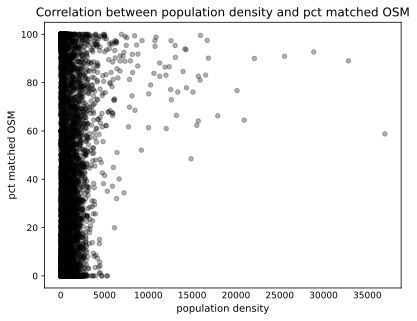

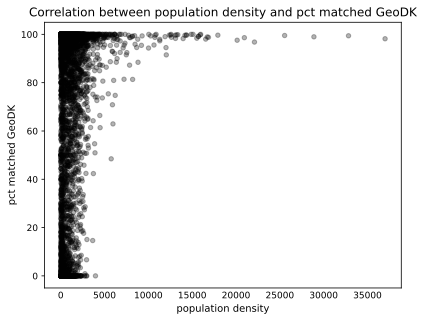

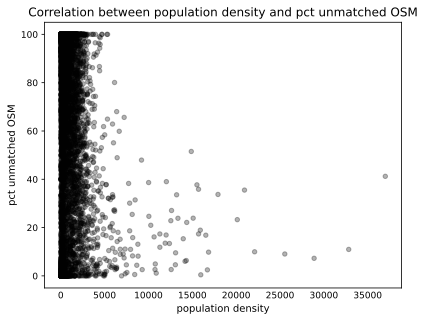

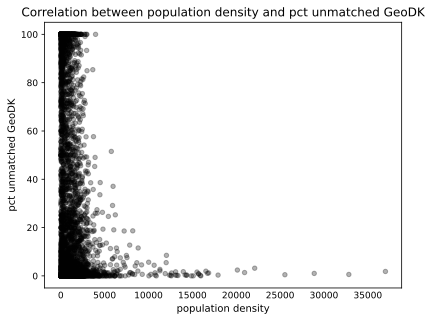

In [37]:
for i, c in enumerate(cols):

    fig, ax = plt.subplots()
    pop_subset.plot.scatter(ax=ax, x="pop_dens",y=c, color="black", alpha=0.3)
    
    plt.title(f"Correlation between population density and {labels[i]}")
    
    ax.set_xlabel("population density")
    ax.set_ylabel(labels[i])

## Component distribution

The section below looks at the distribution for local component count and the distribution of component lengths in the two data sets.

In [ ]:
# PLOT OF LOCAL COMPONENT COUNT

osm_comp_count = extrinsic_grid[["grid_id", "component_count_osm"]].copy()
osm_comp_count = osm_comp_count[osm_comp_count.component_count_osm > 0]

osm_comp_count["source"] = "OSM"
osm_comp_count.rename({"component_count_osm": "component_count"}, inplace=True, axis=1)

geodk_comp_count = extrinsic_grid[["grid_id", "component_count_ref"]].copy()
geodk_comp_count = geodk_comp_count[geodk_comp_count.component_count_ref > 0]

geodk_comp_count["source"] = "GeoDK"
geodk_comp_count.rename(
    {"component_count_ref": "component_count"}, inplace=True, axis=1
)

comp_count = pd.concat([osm_comp_count, geodk_comp_count])

assert len(comp_count) == len(osm_comp_count) + len(geodk_comp_count)

# comp_count_subset = comp_count[comp_count.component_count > 0]

labels = {"source": "Source", "component_count": "Components"}

fig = px.histogram(
    comp_count,
    x="component_count",
    color="source",
    labels=labels,
    nbins=18,
    opacity=[0.8],
    # text_auto=True,
    marginal="rug",
    color_discrete_sequence=["#796eb2", "#f87d2a"],
    # title="Distribution of local component count in OSM and GeoDanmark data",
)
fig.update_layout(
    font=dict(size=12, color="black"),
    autosize=False,
    width=800,
    height=600,
    yaxis_title="Count",
)
fig.write_image(compare_analysis_plots_fp + "component_count_distribution.jpeg")
fig.show()

In [ ]:
# Zipf plot of component lengths

set_renderer(renderer_plot)

osm_component_edges = gpd.read_parquet(
    osm_results_data_fp + "osm_edges_component_id.parquet"
)

grouped_osm_edges = osm_component_edges.groupby("component")

osm_components_length = {}
for comp_nr, group in grouped_osm_edges:
    osm_components_length[comp_nr] = group.length.sum()


assert len(osm_components_length) == len(grouped_osm_edges) == 10686

osm_components_df = pd.DataFrame.from_dict(osm_components_length, orient="index")
osm_components_df.rename(columns={0: "component_length"}, inplace=True)

geodk_component_edges = gpd.read_parquet(
    ref_results_data_fp + "ref_edges_component_id.parquet"
)

grouped_geodk_edges = geodk_component_edges.groupby("component")

geodk_components_length = {}
for comp_nr, group in grouped_geodk_edges:
    geodk_components_length[comp_nr] = group.length.sum()


assert len(geodk_components_length) == len(grouped_geodk_edges) == 4408

geodk_components_df = pd.DataFrame.from_dict(geodk_components_length, orient="index")
geodk_components_df.rename(columns={0: "component_length"}, inplace=True)


In [ ]:
fig = plt.figure(figsize=pdict["fsbar_small"])
axes = fig.add_axes([0, 0, 1, 1])

from matplotlib.patches import Patch

axes.set_axisbelow(True)
axes.grid(True, which="major", ls="dotted")

geodk_yvals = sorted(list(geodk_components_df["component_length"] / 1000), reverse=True)

osm_yvals = sorted(list(osm_components_df["component_length"] / 1000), reverse=True)

axes.scatter(
    x=[i + 1 for i in range(len(osm_components_df))],
    y=osm_yvals,
    s=18,
    color=pdict["osm_base"],
)

axes.scatter(
    x=[i + 1 for i in range(len(geodk_components_df))],
    y=geodk_yvals,
    s=18,
    color=pdict["ref_base"],
)

y_min = min(min(osm_yvals), min(geodk_yvals))
y_max = max(max(osm_yvals), max(geodk_yvals))
axes.set_ylim(
    ymin=10 ** math.floor(math.log10(y_min)),
    ymax=10 ** math.ceil(math.log10(y_max)),
)
axes.set_xscale("log")
axes.set_yscale("log")

axes.set_ylabel("Component length [km]")
axes.set_xlabel("Component rank (largest to smallest)")

legend_patches = [
    Patch(
        facecolor=pdict["osm_base"], edgecolor=pdict["osm_base"], label="Color Patch"
    ),
    Patch(
        facecolor=pdict["ref_base"], edgecolor=pdict["ref_base"], label="Color Patch"
    ),
]

axes.legend(legend_patches, ["OSM", "GeoDanmark"])
axes.set_title("Component length distribution")

fig.savefig(compare_analysis_plots_fp + "zipf.svg")